# Nonproductive TCR/BCR HSC immune i.e. including myeloid - 29 Dec

In [1]:
import numpy as np
import scipy as sp
from scipy.sparse import csr_matrix
import scanpy as sc
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import rc
from matplotlib import colors
import matplotlib.patches as mpatches
import seaborn as sb

In [2]:
# import utils (in github folder utils)
import sys
sys.path.append('/lustre/scratch117/cellgen/team205/cs42/VDJ_collab_manuscript/utils')
from _chenqu_utils import *

In [3]:
sc.settings.set_figure_params(dpi = 160, color_map = 'RdYlBu_r', dpi_save = 300, format = 'pdf')
plt.rcParams["figure.figsize"] = [6,6]
sb.set_palette('colorblind')

In [4]:
# set working directory
%cd /lustre/scratch117/cellgen/team205/cs42/VDJ_collab_manuscript/

/lustre/scratch117/cellgen/team205/cs42/VDJ_collab_manuscript


In [5]:
# figure directory
fig_path = '/home/jovyan/mount/gdrive/VDJ_collab/plots_output/chenqu_jhub/'
sc.settings.figdir = fig_path

In [6]:
organ_order = ['YS','LI','BM','TH','SP','MLN','SK','GU','KI']
organ_name_order = ['Yolk Sac','Liver','Bone Marrow','Thymus','Spleen','Mesenteric Lymph Node','Skin','Gut','Kidney']

# Load data

In [7]:
# object loaded with abTCR, gdTCR, BCR data in 02_panfetal_load_VDJ
adata_source = sc.read('write/PAN.A01.v01.entire_data_normalised_log.20210429.HSC_IMMUNE.embedding_dandelion_110123.h5ad')

Only considering the two last: ['.embedding_dandelion_110123', '.h5ad'].
Only considering the two last: ['.embedding_dandelion_110123', '.h5ad'].


In [8]:
# update productive status to first entry
for chain in ['abT','gdT','B']:
    col1 = 'productive_'+chain+'_VDJ'
    col2 = 'productive_'+chain+'_VJ'
    for col in [col1,col2]:
        select = adata_source.obs[col].str.startswith(('F','T'))
        adata_source.obs.loc[select, col+'_update'] = np.nan
        tmp = adata_source.obs.loc[select, col]
        adata_source.obs.loc[select, col+'_update'] = [string[0:1] for string in tmp]

### abTCR - filter samples that have been sequenced

In [9]:
meta_ab = pd.read_csv('metadata/abTCR_metadata_cleaned_24032022.csv')

In [10]:
adata_ab = adata_source[adata_source.obs['file'].isin(meta_ab['GEX_id'])].copy() # only leave samples that have been abTCR-sequenced

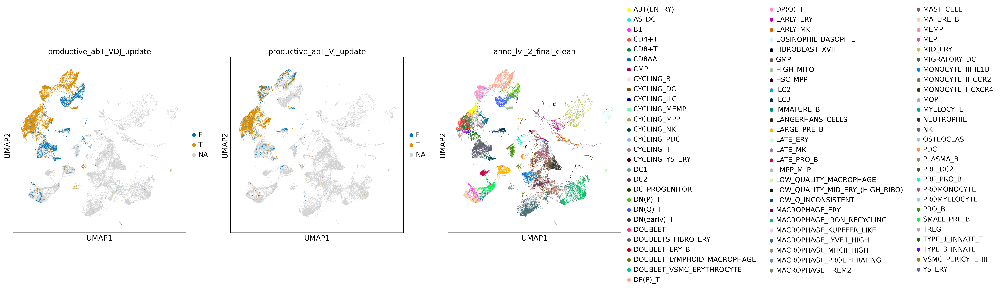

In [11]:
sc.pl.umap(adata_ab,color=['productive_abT_VDJ_update', 'productive_abT_VJ_update','anno_lvl_2_final_clean'])

### gdTCR - filter samples that have been sequenced

In [12]:
meta_gd = pd.read_csv('metadata/gdTCR_metadata_cleaned_24032022.csv')

In [13]:
adata_gd = adata_source[adata_source.obs['file'].isin(meta_gd['GEX file'])].copy() # only leave samples that have been abTCR-sequenced

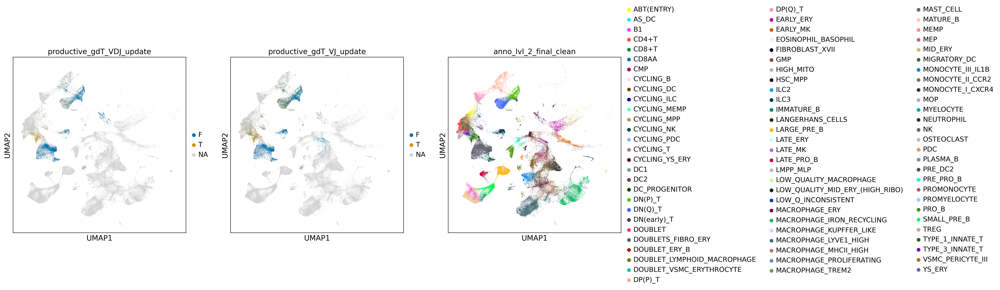

In [14]:
sc.pl.umap(adata_gd,color=['productive_gdT_VDJ_update', 'productive_gdT_VJ_update','anno_lvl_2_final_clean'])

### BCR - filter samples that have been sequenced

In [15]:
meta_bcr = pd.read_csv('metadata/BCR_metadata_cleaned_07092022_with_donors_merged_2samples.csv')

In [16]:
adata_bcr = adata_source[adata_source.obs['file'].isin(meta_bcr['GEX file'])].copy() # only leave samples that have been sequenced

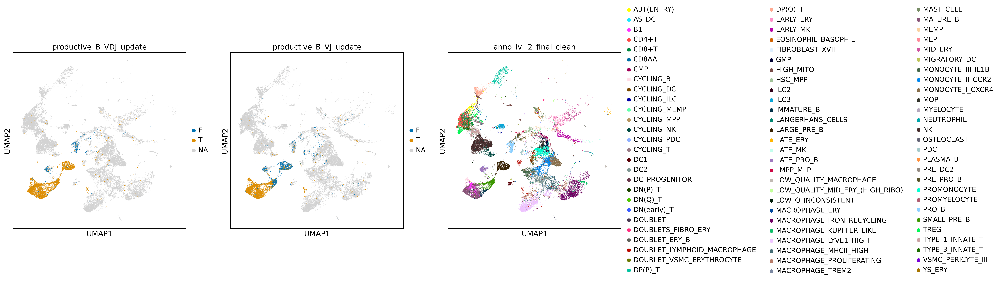

In [17]:
sc.pl.umap(adata_bcr,color=['productive_B_VDJ_update', 'productive_B_VJ_update','anno_lvl_2_final_clean'])

# % of productive & nonproductive TCR/bcr in different cell types

In [18]:
celltypes = [
 'CMP',
 'GMP',
 'PROMYELOCYTE',
 'MYELOCYTE',
 'NEUTROPHIL',
 'MOP',
 'PROMONOCYTE',
 'MONOCYTE_I_CXCR4',
 'MONOCYTE_II_CCR2',
 'MONOCYTE_III_IL1B',
 'DC_PROGENITOR',
 'PDC',
 'CYCLING_PDC',
'AS_DC',
 'PRE_DC2',
 'CYCLING_DC',
 'DC2',
 'DC1',
 'MIGRATORY_DC',
'LANGERHANS_CELLS',
'EOSINOPHIL_BASOPHIL',
 'MAST_CELL',
'MACROPHAGE_LYVE1_HIGH',
 'MACROPHAGE_IRON_RECYCLING',
 'MACROPHAGE_PROLIFERATING',
 'MACROPHAGE_MHCII_HIGH',
 'MACROPHAGE_KUPFFER_LIKE',
 'MACROPHAGE_TREM2',
 'OSTEOCLAST']

### different nonproductive TCR in different cell types - group by sample, color by organ

In [19]:
Counter(adata_bcr[adata_bcr.obs['anno_lvl_2_final_clean'].isin(['CYCLING_PDC','PDC'])].obs['productive_B_VDJ_update'])

Counter({nan: 1178, 'F': 51, 'T': 17})

In [33]:
adata = adata_bcr.copy()
locus = 'IGH'
col_select = 'productive_B_VDJ_update' 

In [34]:
adata.obs['smp_celltype'] = adata.obs['Sample'].astype('string') +'_'+ adata.obs['anno_lvl_2_final_clean'].astype('string')

In [35]:
df1 = pd.DataFrame({'smp_celltype': Counter(adata.obs['smp_celltype']).keys(),
                  'cellcount': Counter(adata.obs['smp_celltype']).values()})

In [36]:
new_list = df1.loc[df1['cellcount']>=20,'smp_celltype'] # smp_celltype of at least 20 cells 

In [37]:
df2 = pd.DataFrame(columns = ['productive','nonproductive','cellcount','ct','organ'], index = new_list)

In [38]:
df2['organ'] = lookup(df2.index, adata.obs, 'smp_celltype','organ')
df2['ct'] = lookup(df2.index, adata.obs, 'smp_celltype','anno_lvl_2_final_clean')
df2['cellcount'] = lookup(df2.index, df1, 'smp_celltype','cellcount')

In [39]:
# only keep celltypes that are in the list of celltypes
df2_sub = df2[df2['ct'].isin(celltypes)]

In [40]:
for feature in df2_sub.index:
    adata_select = adata[list(adata.obs['smp_celltype']==feature)]
    
    df2_sub.loc[feature,'productive'] = sum(adata_select.obs[col_select]=='T')
    df2_sub.loc[feature,'nonproductive'] = sum(adata_select.obs[col_select]=='F')

/home/jovyan/my-conda-envs/skeleton/lib/python3.8/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)


In [41]:
df3 = df2_sub.copy()
df3['productive'] = df3['productive'] / df3['cellcount'] * 100
df3['nonproductive'] = df3['nonproductive'] / df3['cellcount'] * 100

In [42]:
organ_color_map = dict(zip(organ_order, np.array(sb.color_palette('tab10'))[range(len(organ_order))]))

nonproductive IGH % group by sample, color by organ, boxplot

/home/jovyan/my-conda-envs/skeleton/lib/python3.8/site-packages/seaborn/categorical.py:1143: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  hue_mask = self.plot_hues[i] == hue_level


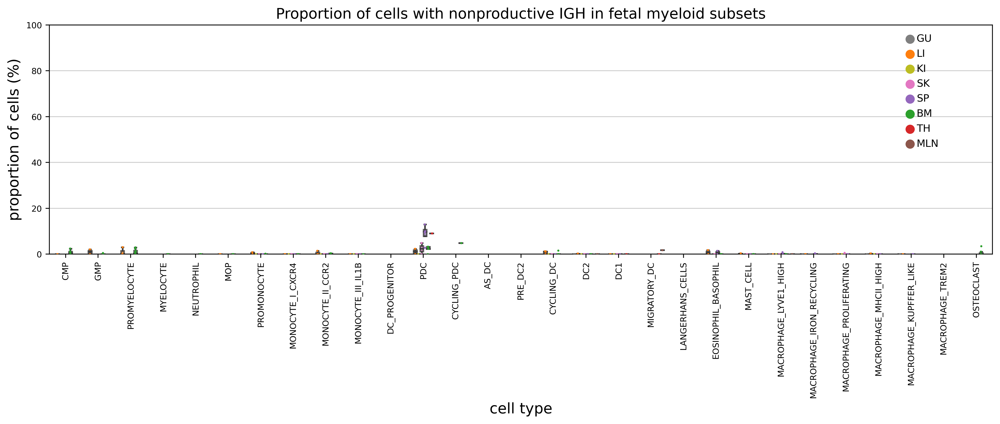

In [43]:
plt.figure(figsize=(16, 4))
ax = sb.boxplot(x="ct", y="nonproductive", hue='organ',order=celltypes,data=df3,
                dodge=True,palette=organ_color_map, showfliers = False, boxprops=dict(alpha=.8))
ax = sb.stripplot(x="ct", y="nonproductive", hue='organ',order=celltypes,data=df3,
                 size=2, dodge=True,palette=organ_color_map)
plt.xticks(fontsize=8,rotation=90)
plt.yticks(fontsize=8)
plt.xlabel('cell type')
plt.ylabel('proportion of cells (%)')
ax.set(ylim=(0, 100))
plt.title('Proportion of cells with nonproductive ' + locus +' in fetal myeloid subsets')
h,l = ax.get_legend_handles_labels()
l1 = ax.legend(h[8:],l[8:],loc='upper left',frameon=False, bbox_to_anchor=(0.9, 1),fontsize='x-small')
plt.savefig(fig_path+'myeloid_nonproductive_'+locus+'_sample.pdf',bbox_inches='tight');

draw productive vs nonproductive

In [44]:
df4 = pd.DataFrame(columns=['value','state','ct','organ'])
df4['value']=list(df3['productive'])+list(df3['nonproductive'])
df4['state']=['productive']*df3.shape[0]+['nonproductive']*df3.shape[0]
df4['ct']=list(df3['ct'])*2
df4['organ']=list(df3['organ'])*2

/home/jovyan/my-conda-envs/skeleton/lib/python3.8/site-packages/seaborn/categorical.py:1143: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  hue_mask = self.plot_hues[i] == hue_level


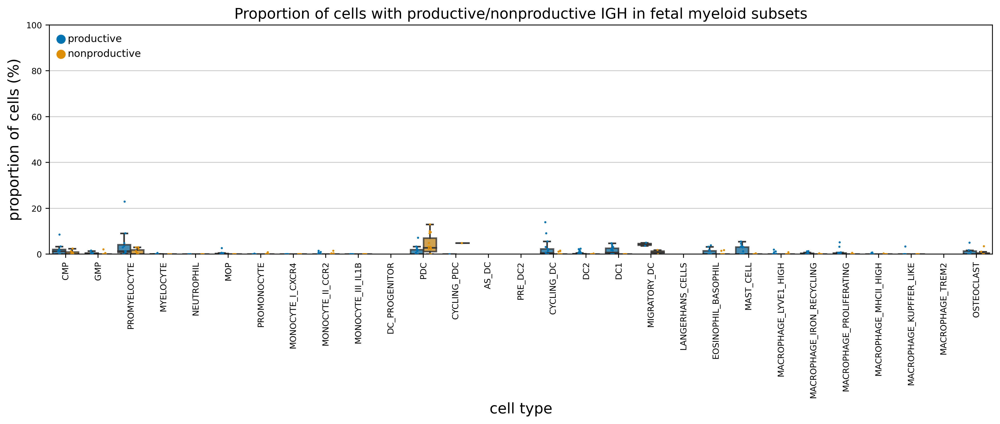

In [45]:
plt.figure(figsize=(16, 4))
ax = sb.boxplot(x="ct", y="value", hue='state',order=celltypes,data=df4,dodge=True, showfliers = False, boxprops=dict(alpha=.8))
ax = sb.stripplot(x="ct", y="value", hue='state',order=celltypes,data=df4,
                 size=2, dodge=True)
plt.xticks(fontsize=8,rotation=90)
plt.yticks(fontsize=8)
plt.xlabel('cell type')
plt.ylabel('proportion of cells (%)')
ax.set(ylim=(0, 100))
plt.title('Proportion of cells with productive/nonproductive ' +locus + ' in fetal myeloid subsets')
h,l = ax.get_legend_handles_labels()
l1 = ax.legend(h[2:],l[2:],loc='upper left',frameon=False, bbox_to_anchor=(0, 1),fontsize='x-small')
plt.savefig(fig_path+'myeloid_sample_prod_nonprod_'+locus+'.pdf',bbox_inches='tight');

# Check RAG expression in pDC

In [33]:
myeloid_select = adata_source[adata_source.obs['anno_lvl_2_final_clean'].isin(['PDC','CYCLING_PDC'])]

(array([2.00e+00, 1.00e+00, 0.00e+00, 0.00e+00, 9.00e+00, 2.18e+03,
        6.70e+02, 1.15e+02, 2.30e+01, 5.00e+00]),
 array([-5.5289297, -4.014275 , -2.4996202, -0.9849655,  0.5296892,
         2.044344 ,  3.5589986,  5.073653 ,  6.5883083,  8.1029625,
         9.617618 ], dtype=float32),
 <BarContainer object of 10 artists>)

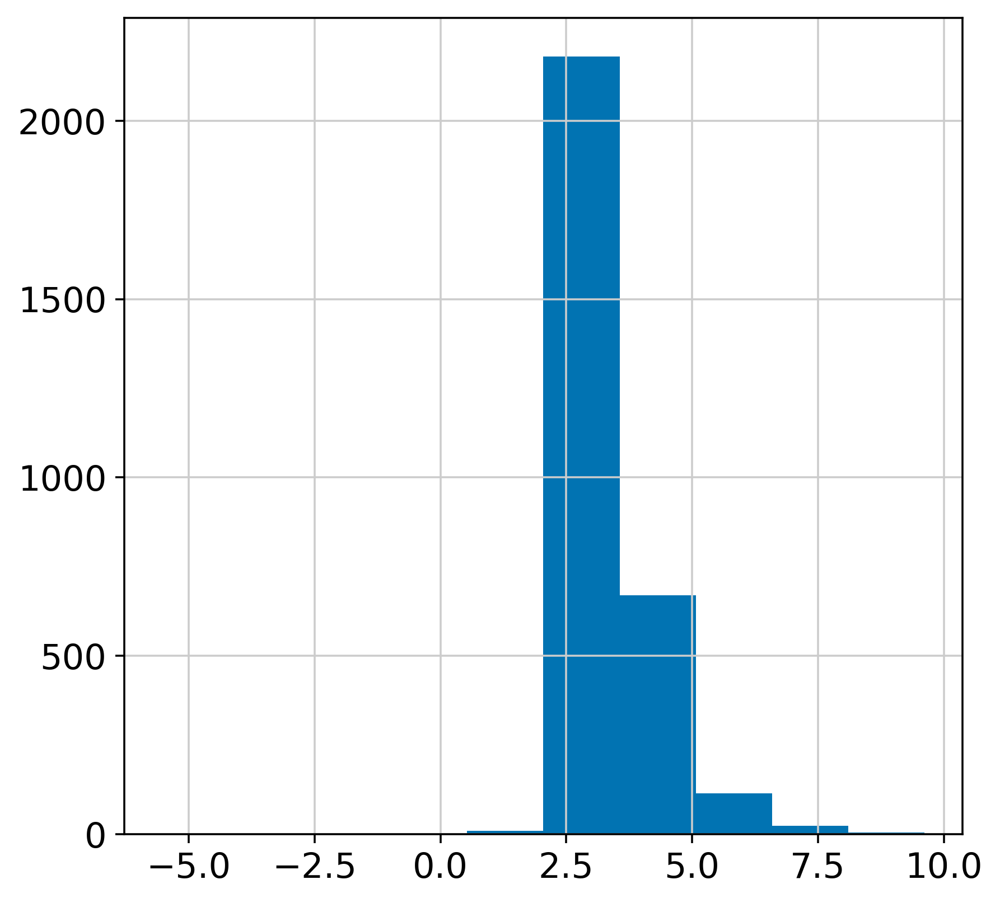

In [48]:
plt.hist(myeloid_select.obsm['X_umap'][:,0])

In [49]:
myeloid_select = myeloid_select[myeloid_select.obsm['X_umap'][:,0]>0]

/home/jovyan/my-conda-envs/skeleton/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


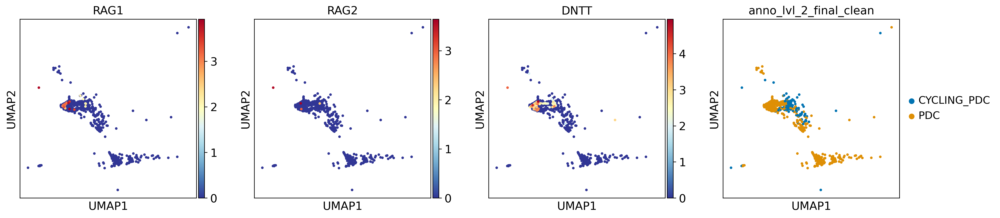

In [50]:
plt.rcParams["figure.figsize"] = [4,4]
sc.pl.umap(myeloid_select, 
           color=['RAG1','RAG2','DNTT','anno_lvl_2_final_clean'],ncols=4, save = 'pDC_RAG.pdf')